## DP1 strong optical--NIR source inspection

This notebook visually inspects sources with strong optical--NIR
contrasts identified from the final DP1 fusion catalogue using forced
photometry.

The statistical extreme-source populations are defined in
`DP1_Source_Statistics.ipynb`. For visual inspection, a stronger
contrast subset is used, requiring S/N >= 5 in at least two bands in
one wavelength regime and |S/N| < 3 in every valid forced measurement
in the opposite regime, together with the core-band coverage and
image-quality requirements defined in the statistics notebook.

The visual selections are used only to identify illustrative examples
and do not modify the source-population statistics.

### 1. Imports

In [1]:
from pathlib import Path
import gc

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from astropy.visualization import ZScaleInterval

import lsst.geom as geom
from lsst.daf.butler import Butler

from matplotlib.patches import Circle

### 2. Data and repository setup

In [2]:
# ============================================================
# Input tables produced by DP1_Source_Statistics.ipynb
# ============================================================

STRONG_INSPECTION_FILE = Path(
    "data/DP1_strong_contrast_inspection_forced.csv"
)

FINAL_EXAMPLE_FILE = Path(
    "data/DP1_final_example_inspection.csv"
)


# ============================================================
# Repositories
# ============================================================

COMCAM_REPO = "dp1"
COMCAM_COLLECTION = "LSSTComCam/DP1"
COMCAM_DATASET_TYPE = "deep_coadd"

VIRCAM_REPO = "lsst-ir-fusion-dp1"
VIRCAM_COLLECTION = (
    "u/ir-sare1/DRP/videoCoaddDetect/20260405T092826Z"
)
VIRCAM_DATASET_TYPE = "deepCoadd_calexp"

SKYMAP = "lsst_cells_v1"


COMCAM_BANDS = [
    "u", "g", "r", "i", "z", "y"
]

VIRCAM_BANDS = [
    "Z", "Y", "J", "H", "K"
]


butler_comcam = Butler.from_config(
    COMCAM_REPO,
    collections=COMCAM_COLLECTION,
)

butler_vista = Butler.from_config(
    VIRCAM_REPO
)

registry_vista = butler_vista.registry

skyMap = butler_comcam.get(
    "skyMap",
    skymap=SKYMAP,
)

### 3. Ranked strong-contrast inspection sample

Load the ranked strong-contrast sources produced by the statistics
notebook. This table is used only for visual inspection and selection
of clean illustrative examples.

In [3]:
# ============================================================
# Ranked strong-contrast inspection sample
# ============================================================

inspection_candidates = pd.read_csv(
    STRONG_INSPECTION_FILE
)


# ------------------------------------------------------------
# Compatibility with inspection files created before the
# final statistics-notebook cleanup
# ------------------------------------------------------------

# Add a simple inspection ID if it is not already present.
if "inspection_id" not in inspection_candidates.columns:

    inspection_candidates[
        "inspection_id"
    ] = np.arange(
        1,
        len(inspection_candidates) + 1,
    )


# The forced S/N values are NaN when the measurement does not
# pass the full forced-photometry validity selection.
# Therefore the number of finite S/N values gives the number
# of valid bands.
if "n_valid_bands" not in inspection_candidates.columns:

    snr_columns = (
        [
            f"snr_ComCam_{band}"
            for band in COMCAM_BANDS
        ]
        +
        [
            f"snr_VIRCAM_{band}"
            for band in VIRCAM_BANDS
        ]
    )

    inspection_candidates[
        "n_valid_bands"
    ] = (
        inspection_candidates[
            snr_columns
        ]
        .notna()
        .sum(axis=1)
    )


# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------

print(
    f"Inspection candidates: "
    f"{len(inspection_candidates)}"
)

print()

print(
    inspection_candidates[
        "sample"
    ].value_counts()
)


display(
    inspection_candidates[
        [
            "inspection_id",
            "catalog_row",
            "sample",
            "ra_deg",
            "dec_deg",
            "n_valid_bands",
            "n_significant_bands",
            "median_significant_snr",
            "max_abs_opposite_snr",
            "nearest_primary_sep_arcsec",
        ]
    ]
)

Inspection candidates: 24

sample
NIR_significant       20
ComCam_significant     4
Name: count, dtype: int64


,inspection_id,catalog_row,sample,ra_deg,dec_deg,n_valid_bands,n_significant_bands,median_significant_snr,max_abs_opposite_snr,nearest_primary_sep_arcsec
0,1,163503,ComCam_significant,53.621950,-27.659692,9,3,6.056666,2.207638,6.092301
1,2,573825,ComCam_significant,53.604866,-27.840971,10,2,5.694068,2.001595,8.568890
2,3,607371,ComCam_significant,53.720010,-28.046087,10,2,6.657598,2.090794,6.160234
3,4,883070,ComCam_significant,53.467985,-28.427412,10,2,5.985270,1.410415,6.002824
4,5,70179,NIR_significant,52.477046,-27.830815,9,5,20.118377,1.598241,9.754040
5,6,666836,NIR_significant,52.653276,-27.633525,11,5,16.247038,2.415569,9.236922
6,7,252997,NIR_significant,52.468875,-28.037428,9,5,19.939622,2.393062,8.197731
7,8,57122,NIR_significant,52.455010,-27.986315,9,5,44.895305,2.718032,8.128705
8,9,453852,NIR_significant,52.558058,-27.745834,9,5,15.140711,2.634865,7.941971
9,10,197408,NIR_significant,52.862614,-27.546313,11,5,10.319294,2.643548,7.802467


### 4. Coadd cutouts

Locate each source on the common Rubin SkyMap and retrieve the
corresponding ComCam and VIRCAM coadd cutouts.

In [4]:
CUTOUT_SIZE_PIX = 80


def get_tract_patch(ra_deg, dec_deg):

    coord = geom.SpherePoint(
        ra_deg * geom.degrees,
        dec_deg * geom.degrees,
    )

    tract_info = skyMap.findTract(coord)
    patch_info = tract_info.findPatch(coord)

    return (
        coord,
        tract_info.getId(),
        patch_info.getSequentialIndex(),
    )


def get_cutout(
    ra_deg,
    dec_deg,
    instrument,
    band,
):

    coord, tract, patch = get_tract_patch(
        ra_deg,
        dec_deg,
    )


    # --------------------------------------------------------
    # ComCam
    # --------------------------------------------------------

    if instrument == "ComCam":

        data_id = {
            "skymap": SKYMAP,
            "tract": tract,
            "patch": patch,
            "band": band,
        }

        exposure = butler_comcam.get(
            COMCAM_DATASET_TYPE,
            data_id,
        )


    # --------------------------------------------------------
    # VIRCAM
    #
    # Query the available deepCoadd_calexp refs in the
    # preferred run, then select the requested band.
    # This is the same retrieval method used by the
    # final paper-figure code.
    # --------------------------------------------------------

    else:

        data_id = {
            "skymap": SKYMAP,
            "tract": tract,
            "patch": patch,
        }

        refs = list(
            set(
                registry_vista.queryDatasets(
                    VIRCAM_DATASET_TYPE,
                    dataId=data_id,
                    collections=[
                        VIRCAM_COLLECTION
                    ],
                )
            )
        )

        refs = [
            ref
            for ref in refs
            if str(
                ref.dataId["band"]
            ) == band
        ]

        if len(refs) == 0:

            raise RuntimeError(
                f"No VIRCAM {band} coadd "
                f"for tract={tract}, "
                f"patch={patch}"
            )

        exposure = butler_vista.get(
            refs[0]
        )


    # --------------------------------------------------------
    # Cutout
    # --------------------------------------------------------

    cutout = exposure.getCutout(
        coord,
        geom.Extent2I(
            CUTOUT_SIZE_PIX,
            CUTOUT_SIZE_PIX,
        ),
    )

    del exposure
    gc.collect()

    return cutout, coord

### 5. Eleven-band source viewer

Display matched cutouts in the six ComCam and five VIRCAM bands.
Each panel is independently scaled for visual inspection. The red
circle marks the catalogue position, and the forced-photometry S/N is
shown above each panel.

In [5]:
def plot_candidate(
    table,
    candidate_index,
    id_column=None,
):

    row = table.iloc[
        candidate_index
    ]

    ra = float(
        row["ra_deg"]
    )

    dec = float(
        row["dec_deg"]
    )


    band_info = (
        [
            ("ComCam", band)
            for band in COMCAM_BANDS
        ]
        +
        [
            ("VIRCAM", band)
            for band in VIRCAM_BANDS
        ]
    )


    fig, axes = plt.subplots(
        3,
        4,
        figsize=(11, 8.5),
    )

    axes = axes.ravel()


    for ax, (
        instrument,
        band,
    ) in zip(
        axes,
        band_info,
    ):

        snr_column = (
            f"snr_{instrument}_{band}"
        )

        snr = row.get(
            snr_column,
            np.nan,
        )


        try:

            cutout, coord = get_cutout(
                ra,
                dec,
                instrument,
                band,
            )

            image = (
                cutout.image.array
            )

            finite = np.isfinite(
                image
            )


            if finite.any():

                values = image[
                    finite
                ]

                try:

                    vmin, vmax = (
                        ZScaleInterval()
                        .get_limits(
                            values
                        )
                    )

                except Exception:

                    vmin, vmax = (
                        np.nanpercentile(
                            values,
                            [1, 99],
                        )
                    )


                if (
                    not np.isfinite(vmin)
                    or not np.isfinite(vmax)
                    or vmin >= vmax
                ):

                    vmin, vmax = (
                        np.nanpercentile(
                            values,
                            [1, 99],
                        )
                    )


                if (
                    not np.isfinite(vmin)
                    or not np.isfinite(vmax)
                    or vmin >= vmax
                ):

                    centre = np.nanmedian(
                        values
                    )

                    spread = np.nanstd(
                        values
                    )

                    if (
                        not np.isfinite(
                            spread
                        )
                        or spread == 0
                    ):

                        spread = 1.0

                    vmin = (
                        centre
                        - spread
                    )

                    vmax = (
                        centre
                        + spread
                    )


                ax.imshow(
                    image,
                    origin="lower",
                    cmap="gray",
                    vmin=vmin,
                    vmax=vmax,
                )


                xy = (
                    cutout.wcs
                    .skyToPixel(
                        coord
                    )
                )

                x = (
                    xy.x
                    - cutout
                    .getBBox()
                    .getMinX()
                )

                y = (
                    xy.y
                    - cutout
                    .getBBox()
                    .getMinY()
                )


                ax.add_patch(
                    Circle(
                        (x, y),
                        radius=4.5,
                        fill=False,
                        linewidth=1.2,
                        edgecolor="red",
                    )
                )


            del cutout
            gc.collect()


        except Exception:

            ax.text(
                0.5,
                0.5,
                "Unavailable",
                ha="center",
                va="center",
                transform=ax.transAxes,
            )


        display_band = (
            r"$K_{\rm s}$"
            if (
                instrument
                == "VIRCAM"
                and band == "K"
            )
            else band
        )


        if np.isfinite(
            snr
        ):

            ax.set_title(
                (
                    f"{display_band}\n"
                    f"S/N = {snr:.1f}"
                ),
                fontsize=8,
            )

        else:

            ax.set_title(
                (
                    f"{display_band}\n"
                    "S/N = --"
                ),
                fontsize=8,
            )


        ax.set_xticks([])
        ax.set_yticks([])


    axes[-1].axis(
        "off"
    )


    sample_name = (
        row.get(
            "sample",
            ""
        )
    )


    if (
        id_column is not None
        and id_column in row.index
    ):

        source_label = (
            f"{id_column} = "
            f"{row[id_column]}"
        )

    else:

        source_label = (
            f"row {candidate_index}"
        )


    title = (
        f"{source_label}"
        f" — {sample_name}\n"
        f"RA = {ra:.6f} deg, "
        f"Dec = {dec:.6f} deg"
    )


    if (
        "n_significant_bands"
        in row.index
    ):

        title += (
            f" | "
            f"{int(row['n_significant_bands'])} "
            f"significant bands"
        )


    if (
        "max_abs_opposite_snr"
        in row.index
        and np.isfinite(
            row[
                "max_abs_opposite_snr"
            ]
        )
    ):

        title += (
            f" | max opposite |S/N| = "
            f"{row['max_abs_opposite_snr']:.2f}"
        )


    fig.suptitle(
        title,
        fontsize=12,
    )

    plt.tight_layout()
    plt.show()

### 6. Inspect ranked candidates

Choose any row from the ranked inspection table for visual inspection.

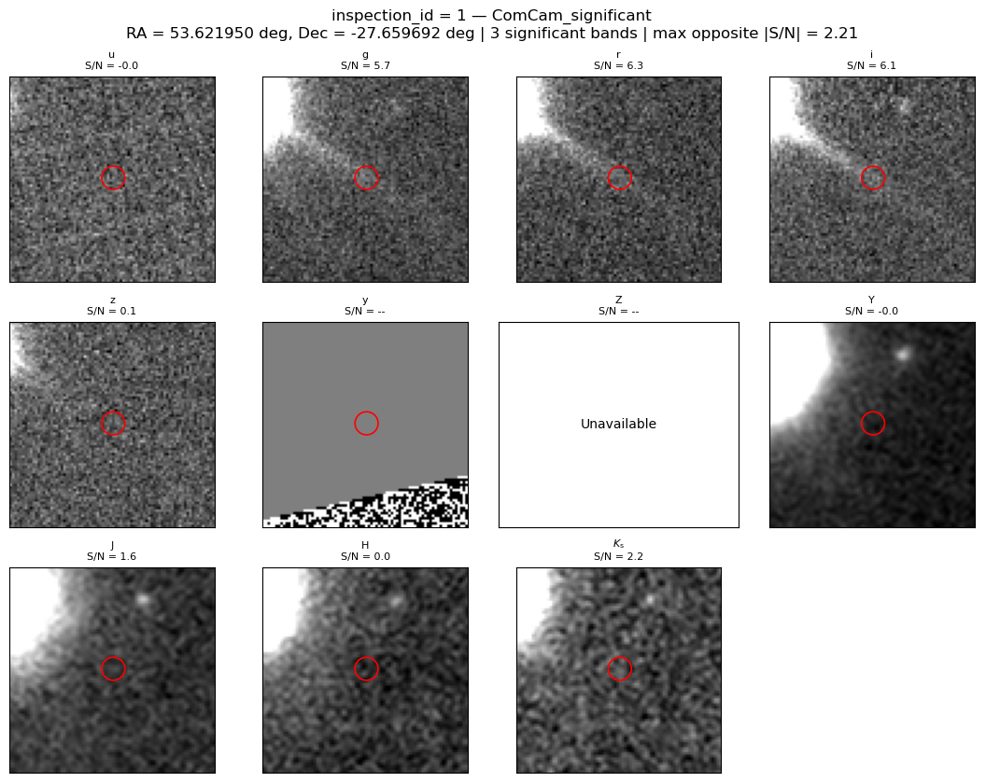

In [6]:
INSPECTION_INDEX = 0

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

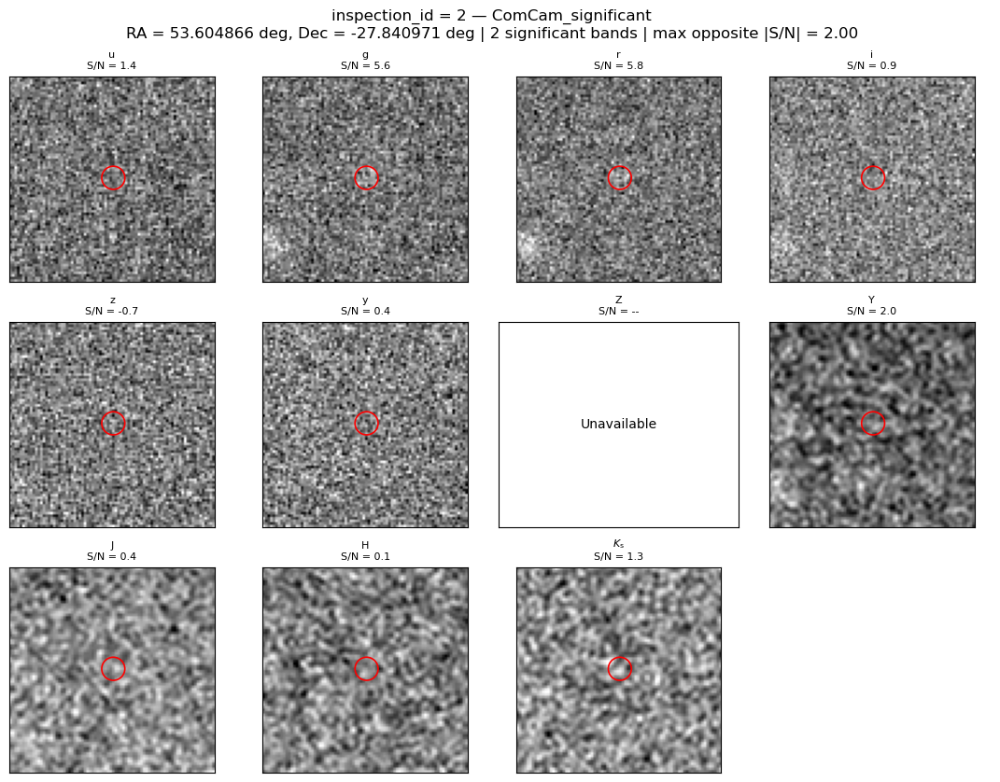

In [7]:
INSPECTION_INDEX = 1

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

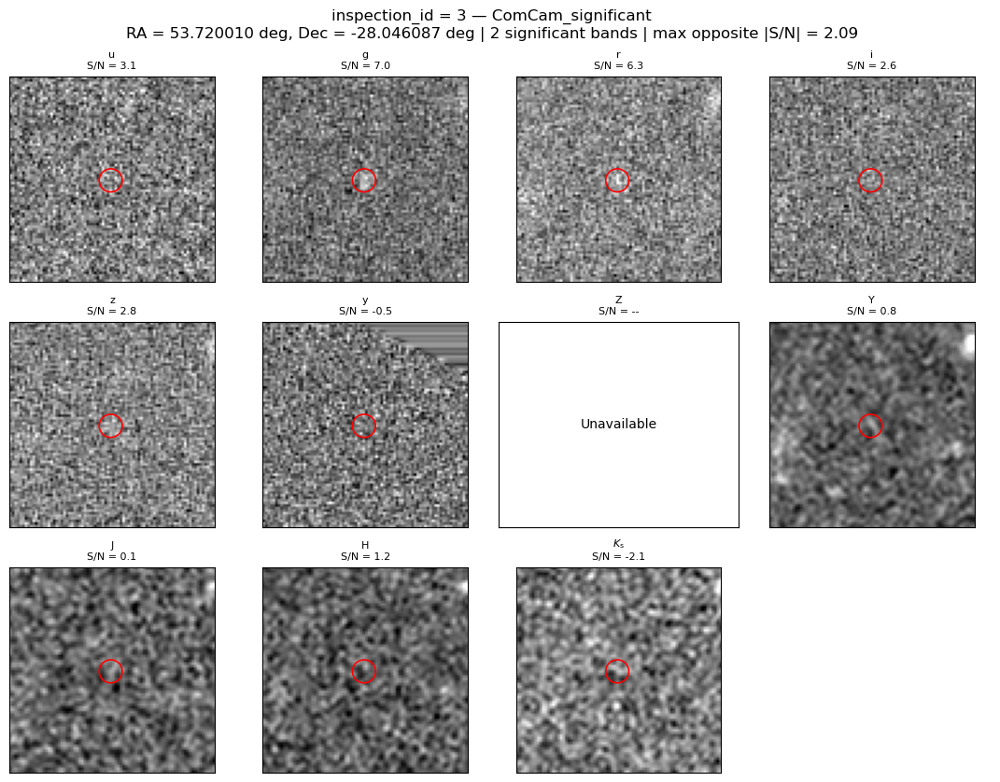

In [8]:
INSPECTION_INDEX = 2

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

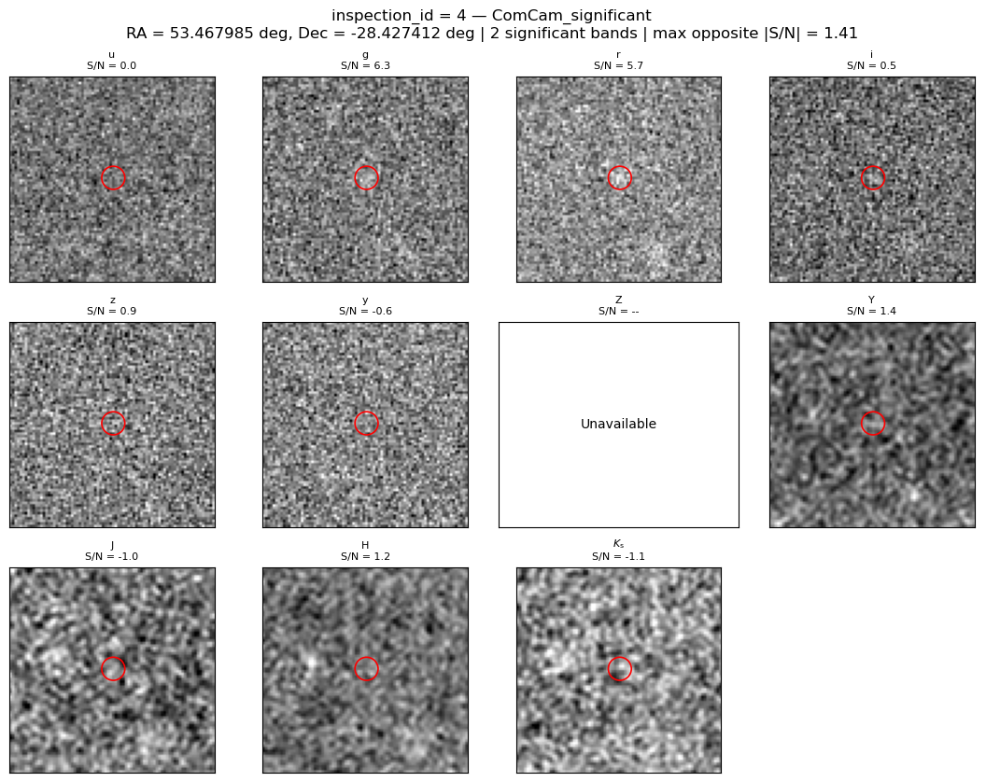

In [9]:
INSPECTION_INDEX = 3

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

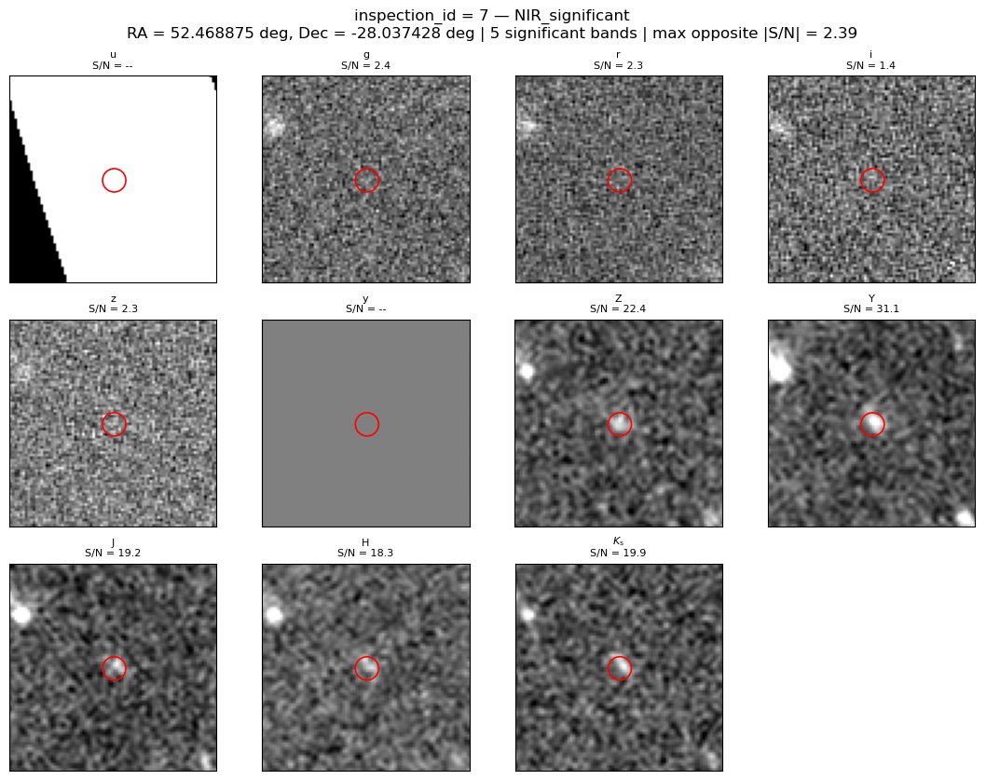

In [10]:
INSPECTION_INDEX = 6

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

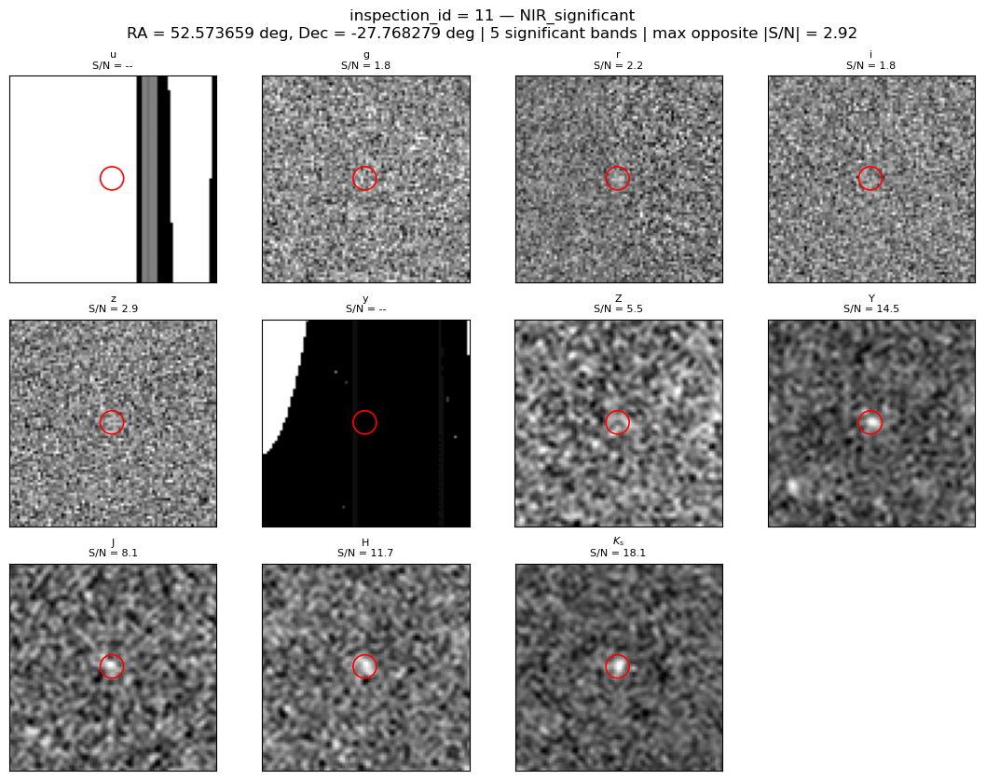

In [11]:
INSPECTION_INDEX = 10

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

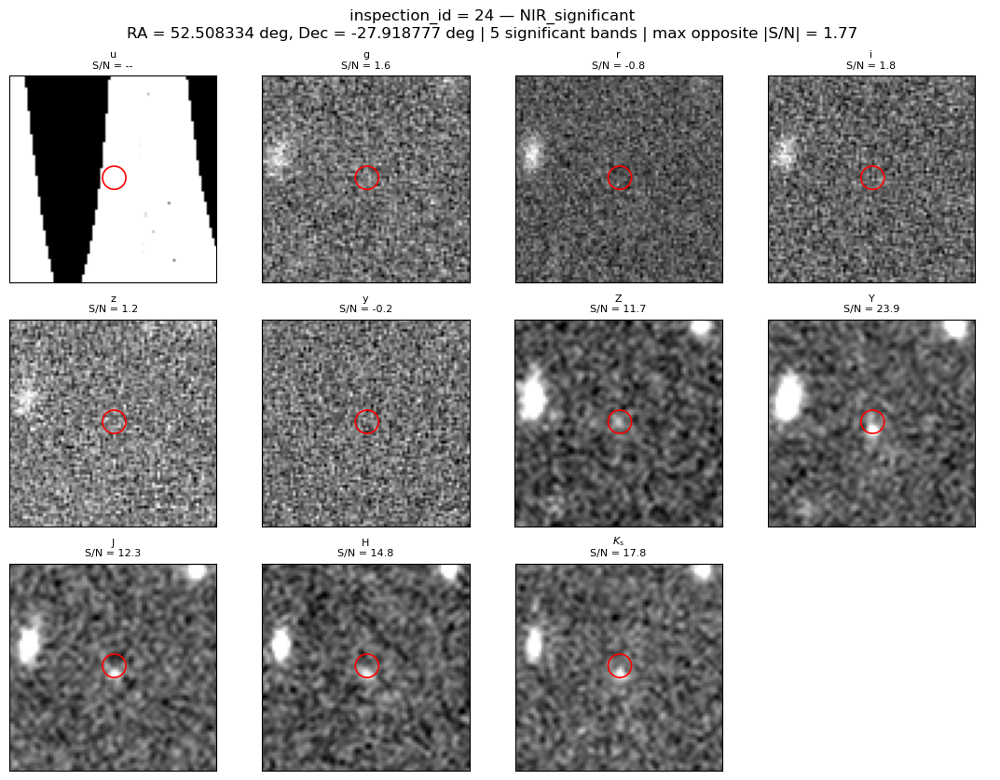

In [12]:
INSPECTION_INDEX = 23

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

### 7. Final paper examples

Load the four examples retained after visual inspection in the statistics
notebook. Candidates 1 and 2 are ComCam-significant examples, while
candidates 3 and 4 are NIR-significant examples.

In [13]:
final_examples = pd.read_csv(
    FINAL_EXAMPLE_FILE
)

display(
    final_examples[
        [
            "candidate_id",
            "catalog_row",
            "sample",
            "ra_deg",
            "dec_deg",
            "n_valid_bands",
            "n_significant_bands",
            "median_significant_snr",
            "max_abs_opposite_snr",
        ]
    ]
)

,candidate_id,catalog_row,sample,ra_deg,dec_deg,n_valid_bands,n_significant_bands,median_significant_snr,max_abs_opposite_snr
0,1,15805,ComCam_significant,53.073812,-27.732826,10,2,14.991056,1.279470
1,2,441278,ComCam_significant,53.593073,-27.926565,8,3,8.452413,1.713349
2,3,197408,NIR_significant,52.862614,-27.546313,11,5,10.319294,2.643548
3,4,666836,NIR_significant,52.653276,-27.633525,11,5,16.247038,2.415569


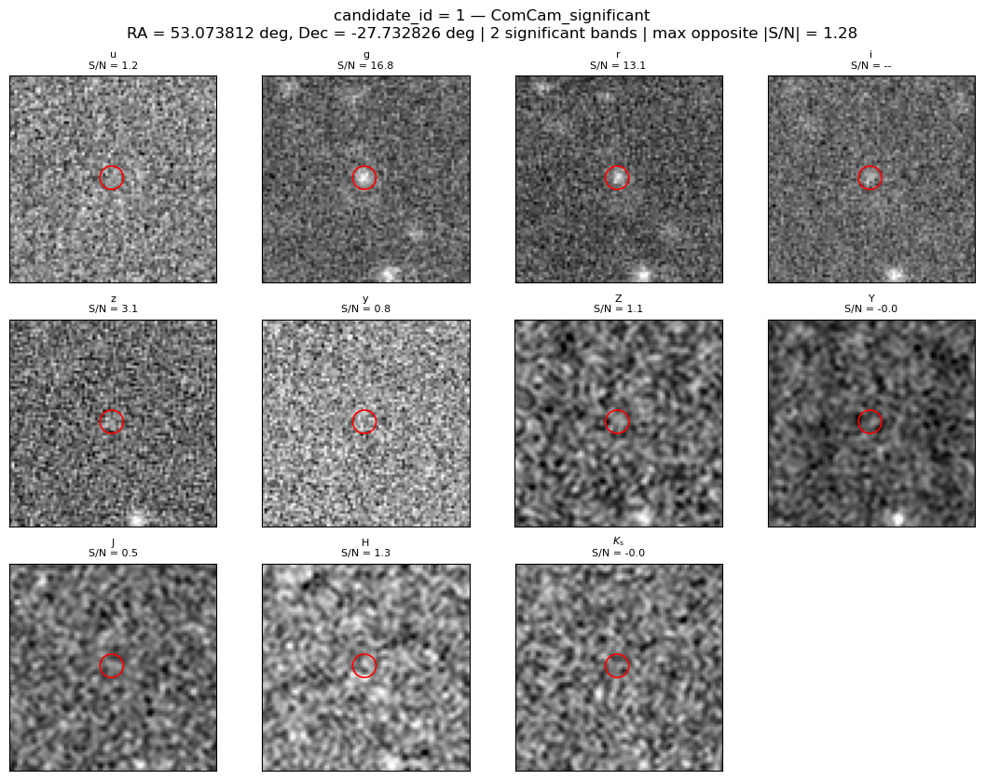

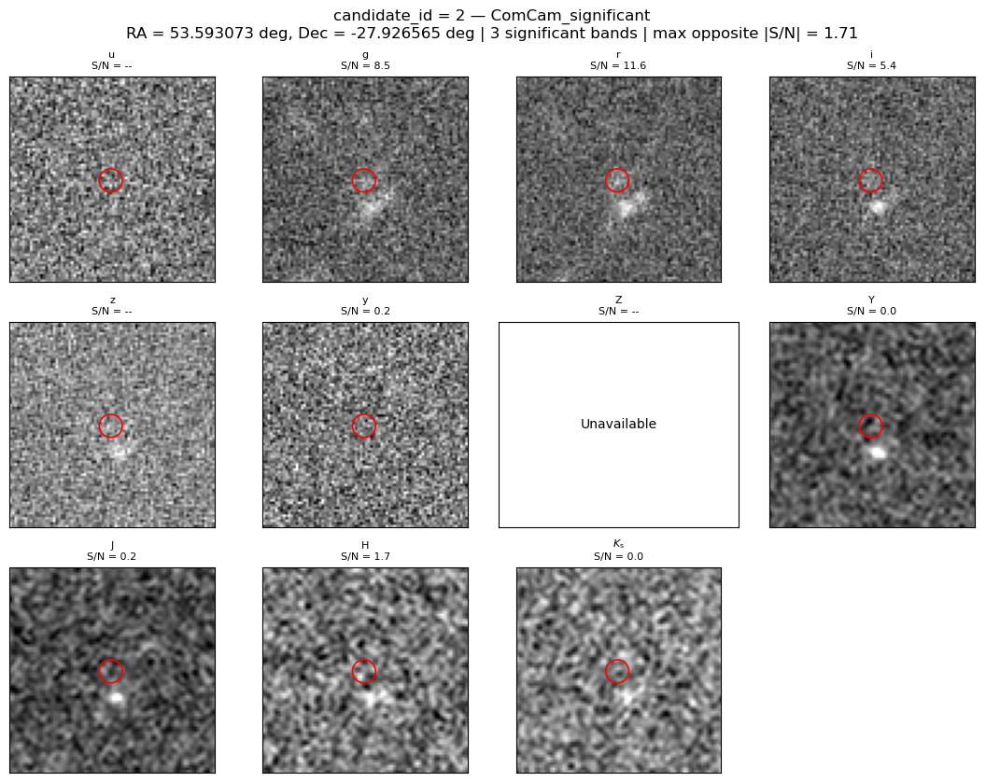

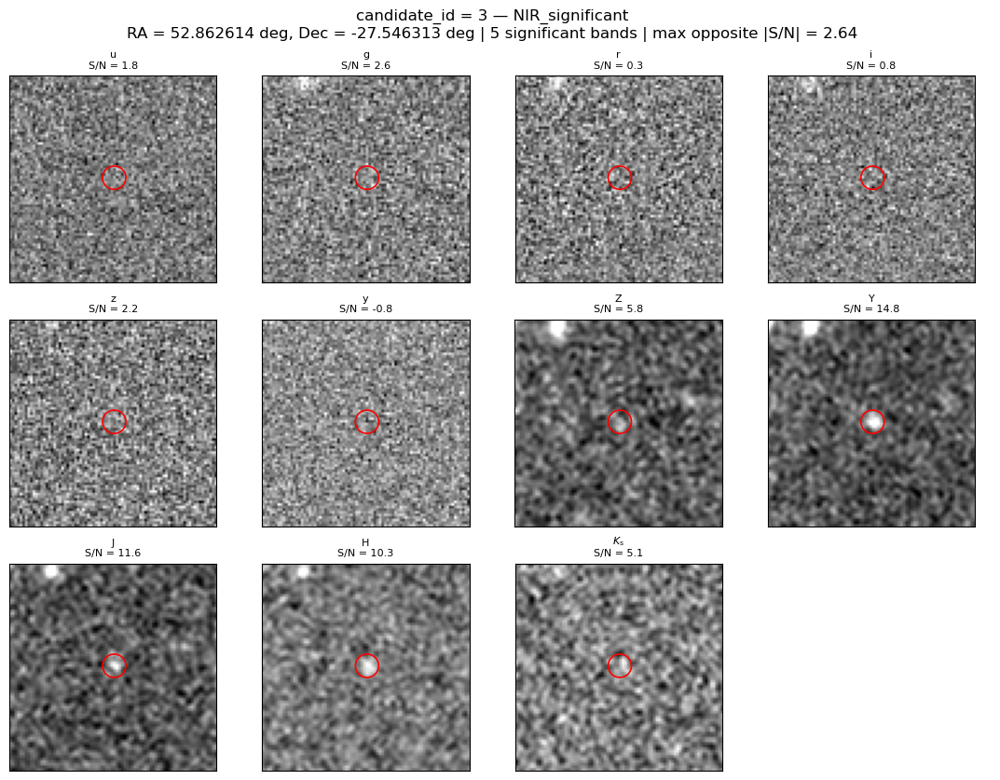

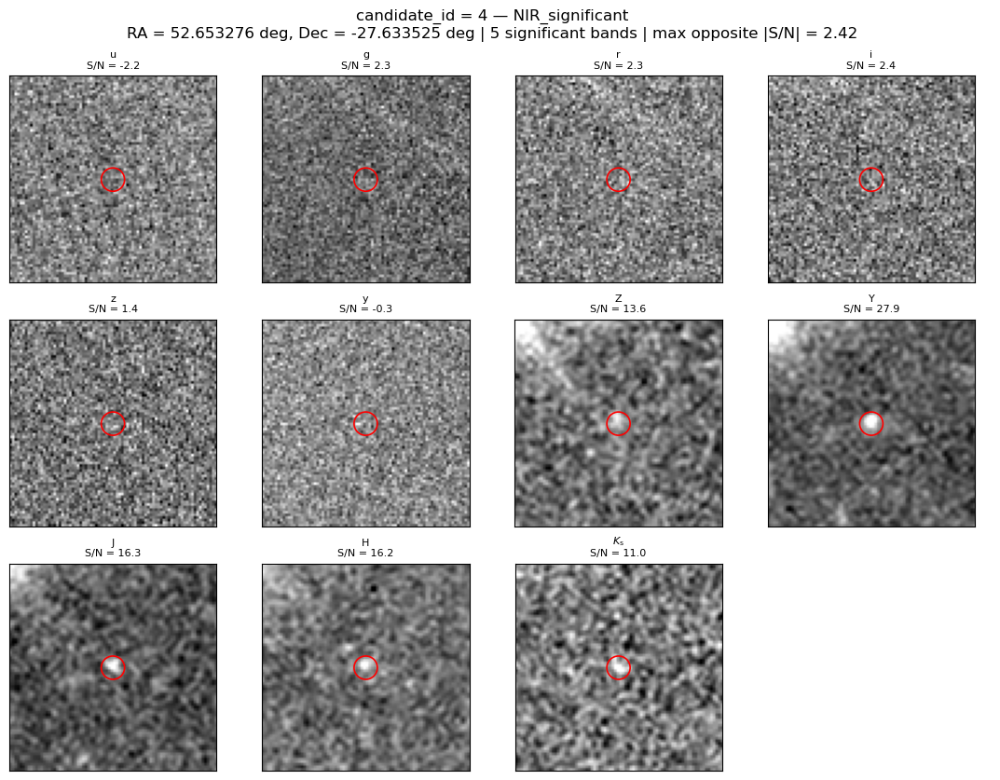

In [14]:
for candidate_index in range(
    len(final_examples)
):

    plot_candidate(
        final_examples,
        candidate_index,
        id_column="candidate_id",
    )

    plt.close("all")
    gc.collect()

### 8. Paper plot

Cutout size: 300 pixels = 60.0 arcsec


,candidate_id,sample,ra_deg,dec_deg
0,1,ComCam_significant,53.073812,-27.732826
1,3,NIR_significant,52.862614,-27.546313



Loading candidate 1
  u: (300, 300)
  g: (300, 300)
  r: (300, 300)
  i: (300, 300)
  z: (300, 300)
  y: (300, 300)
  Z: (300, 300)
  Y: (300, 300)
  J: (300, 300)
  H: (300, 300)
  K: (300, 300)

Loading candidate 3
  u: (300, 300)
  g: (300, 300)
  r: (300, 300)
  i: (300, 300)
  z: (300, 300)
  y: (300, 300)
  Z: (300, 300)
  Y: (300, 300)
  J: (300, 300)
  H: (300, 300)
  K: (300, 300)


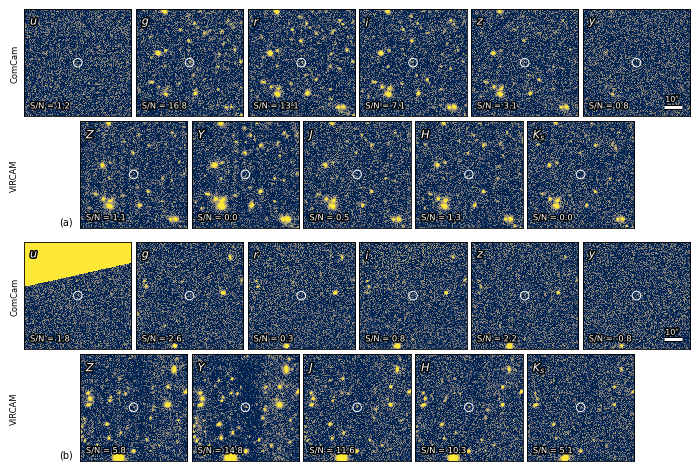

Saved PDF: data/image_products/dp1_extreme_optical_nir_examples.pdf


In [15]:
# ============================================================
# FINAL EXTREME-SOURCE FIGURE
#
# Display treatment copied from the UDG figure:
#   - original coadd image values
#   - NO_DATA pixels masked
#   - NO background subtraction
#   - NO smoothing
#   - NO RMS/significance normalization
#   - NO transparency
#   - independent robust asinh stretch per panel
#
# Candidate 1:
#   ComCam ugrizy
#   VIRCAM ZYJHKs
#
# Candidate 3:
#   ComCam ugrizy
#   VIRCAM ZYJHKs
# ============================================================

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

from astropy.visualization import AsinhStretch, ImageNormalize

import lsst.daf.butler as dafButler
import lsst.geom as geom

import matplotlib as mpl

mpl.rcParams["pdf.compression"] = 9

# ------------------------------------------------------------
# Repositories
# ------------------------------------------------------------

COMCAM_REPO = "dp1"
COMCAM_COLLECTION = "LSSTComCam/DP1"
COMCAM_DATASET_TYPE = "deep_coadd"

VIRCAM_REPO = "lsst-ir-fusion-dp1"
VIRCAM_DATASET_TYPE = "deepCoadd_calexp"

VIRCAM_PREFERRED_RUN = (
    "u/ir-sare1/DRP/videoCoaddDetect/"
    "20260405T092826Z"
)

SKYMAP = "lsst_cells_v1"


# ------------------------------------------------------------
# Bands
# ------------------------------------------------------------

COMCAM_BANDS = ["u", "g", "r", "i", "z", "y"]
VIRCAM_BANDS = ["Z", "Y", "J", "H", "K"]
ALL_BANDS = COMCAM_BANDS + VIRCAM_BANDS

PANEL_LABELS = {
    "u": r"$u$",
    "g": r"$g$",
    "r": r"$r$",
    "i": r"$i$",
    "z": r"$z$",
    "y": r"$y$",
    "Z": r"$Z$",
    "Y": r"$Y$",
    "J": r"$J$",
    "H": r"$H$",
    "K": r"$K_s$",
}


# ------------------------------------------------------------
# Display settings
#
# These are the SAME values used in the UDG notebook.
# ------------------------------------------------------------

CMAP_NAME = "cividis"

PIXEL_SCALE_ARCSEC = 0.2

# UDG figure used 300 pixels = 60 arcsec.
#
# For these compact sources use 180 pixels = 36 arcsec,
# so the sources remain visible while the background is
# sampled over a substantially larger area.
CUTOUT_SIZE_PIX = 300

# Marker
CIRCLE_RADIUS_PIX = 12.0
CIRCLE_LINEWIDTH = 0.7

# One angular scale bar
SCALE_BAR_ARCSEC = 10


# ------------------------------------------------------------
# Output
# ------------------------------------------------------------

OUTDIR = Path("data/image_products")
OUTDIR.mkdir(parents=True, exist_ok=True)

OUTPUT_PDF = (
    OUTDIR
    / "dp1_extreme_optical_nir_examples.pdf"
)


# ------------------------------------------------------------
# Load the two selected sources
# ------------------------------------------------------------

examples = (
    final_examples
    .set_index(
        "candidate_id"
    )
    .loc[
        [1, 3]
    ]
    .reset_index()
)

print(
    "Cutout size:",
    CUTOUT_SIZE_PIX,
    "pixels =",
    CUTOUT_SIZE_PIX * PIXEL_SCALE_ARCSEC,
    "arcsec"
)

display(
    examples[
        [
            "candidate_id",
            "sample",
            "ra_deg",
            "dec_deg",
        ]
    ]
)


# ------------------------------------------------------------
# Open Butlers
# ------------------------------------------------------------

butler_comcam = dafButler.Butler(
    COMCAM_REPO,
    collections=COMCAM_COLLECTION,
)

butler_vista = dafButler.Butler(
    VIRCAM_REPO
)

registry_vista = butler_vista.registry

skymap = butler_comcam.get(
    "skyMap"
)


# ============================================================
# EXACT UDG-STYLE CUTOUT FUNCTIONS
# ============================================================

def make_cutout_bbox(
    exposure,
    sky_position,
    size_pix,
):
    """
    Construct square parent-coordinate bounding box.

    This is the same method used by the UDG notebook.
    """

    centre = geom.Point2I(
        exposure
        .getWcs()
        .skyToPixel(
            sky_position
        )
    )

    extent = geom.Extent2I(
        size_pix,
        size_pix,
    )

    minimum = (
        centre
        - extent // 2
    )

    bbox = geom.Box2I(
        minimum,
        extent,
    )

    if not exposure.getBBox().contains(
        bbox
    ):
        raise ValueError(
            "Requested cutout is not fully "
            "contained in exposure."
        )

    return bbox


def extract_cutout(
    exposure,
    sky_position,
    size_pix,
):
    """
    Return image cutout with NO_DATA pixels masked.
    No background subtraction is performed.
    """

    bbox = make_cutout_bbox(
        exposure,
        sky_position,
        size_pix,
    )

    cutout = exposure.getCutout(
        bbox
    )

    array = np.asarray(
        cutout.image.array,
        dtype=float,
    ).copy()

    mask_dict = (
        cutout.mask
        .getMaskPlaneDict()
    )

    if "NO_DATA" in mask_dict:

        bit = mask_dict["NO_DATA"]

        no_data = (
            np.asarray(
                cutout.mask.array,
                dtype=np.int64,
            )
            & (1 << bit)
        ) != 0

        array[no_data] = np.nan

    array[
        ~np.isfinite(array)
    ] = np.nan

    return array


# ============================================================
# EXACT UDG DISPLAY NORMALIZATION
# ============================================================

def robust_sigma(values):
    """
    Gaussian-equivalent MAD scatter.
    """

    values = np.asarray(
        values,
        dtype=float,
    )

    values = values[
        np.isfinite(values)
    ]

    if values.size == 0:
        return np.nan

    median = np.median(
        values
    )

    mad = np.median(
        np.abs(
            values - median
        )
    )

    return 1.4826 * mad


def display_normalization(
    array,
    band,
):
    """
    Paper-display normalization.

    The local background is estimated robustly.
    Each panel is displayed relative to its own local sky RMS,
    using the SAME sigma range in every band.

    Bright unrelated objects therefore cannot determine vmax.
    """

    finite = np.asarray(
        array,
        dtype=float,
    )

    finite = finite[
        np.isfinite(finite)
    ]

    if finite.size == 0:
        raise ValueError(
            f"No finite pixels in {band}"
        )

    # --------------------------------------------------------
    # Robust local background
    # --------------------------------------------------------

    median = np.median(
        finite
    )

    sigma = robust_sigma(
        finite
    )

    if (
        not np.isfinite(sigma)
        or sigma <= 0
    ):
        sigma = np.std(
            finite
        )

    # --------------------------------------------------------
    # Fixed background-relative display limits
    #
    # Same definition in every panel.
    # --------------------------------------------------------

    vmin = (
       median
       - 0.1 * sigma
    )

    vmax = (
        median
        + 8 * sigma
    )

    norm = ImageNormalize(
        vmin=vmin,
        vmax=vmax,
        stretch=AsinhStretch(
            a=0.05
        ),
        clip=True,
    )

    return norm

# ============================================================
# Retrieve one band at one candidate position
# ============================================================

def load_band(
    ra_deg,
    dec_deg,
    band,
):

    sky_position = (
        geom.SpherePoint(
            ra_deg * geom.degrees,
            dec_deg * geom.degrees,
        )
    )

    tract_info = (
        skymap.findTract(
            sky_position
        )
    )

    patch_info = (
        tract_info.findPatch(
            sky_position
        )
    )

    tract = tract_info.getId()

    patch = (
        patch_info
        .getSequentialIndex()
    )

    data_id = {
        "skymap": SKYMAP,
        "tract": tract,
        "patch": patch,
    }


    # --------------------------------------------------------
    # ComCam
    # --------------------------------------------------------

    if band in COMCAM_BANDS:

        refs = list(
            set(
                butler_comcam.query_datasets(
                    COMCAM_DATASET_TYPE,
                    tract=tract,
                    patch=patch,
                    where=f"band = '{band}'",
                )
            )
        )

        if len(refs) == 0:
            raise RuntimeError(
                f"No ComCam {band} coadd"
            )

        exposure = (
            butler_comcam.get(
                refs[0]
            )
        )


    # --------------------------------------------------------
    # VIRCAM
    # --------------------------------------------------------

    else:

        refs = list(
            set(
                registry_vista.queryDatasets(
                    VIRCAM_DATASET_TYPE,
                    dataId=data_id,
                    collections=[
                        VIRCAM_PREFERRED_RUN
                    ],
                )
            )
        )

        refs = [
            ref
            for ref in refs
            if str(
                ref.dataId["band"]
            ) == band
        ]

        if len(refs) == 0:
            raise RuntimeError(
                f"No VIRCAM {band} coadd"
            )

        exposure = (
            butler_vista.get(
                refs[0]
            )
        )


    array = extract_cutout(
        exposure,
        sky_position,
        CUTOUT_SIZE_PIX,
    )

    return array


# ============================================================
# Load the 22 panels
# ============================================================

cutout_arrays = {}

for candidate_index, row in (
    examples.iterrows()
):

    cutout_arrays[
        candidate_index
    ] = {}

    print(
        "\nLoading candidate",
        int(row["candidate_id"])
    )

    for band in ALL_BANDS:

        try:

            array = load_band(
                float(row["ra_deg"]),
                float(row["dec_deg"]),
                band,
            )

            cutout_arrays[
                candidate_index
            ][band] = array

            print(
                f"  {band}:",
                array.shape
            )

        except Exception as exc:

            print(
                f"  {band}: FAILED",
                exc
            )

            cutout_arrays[
                candidate_index
            ][band] = None


# ============================================================
# PAPER FIGURE
#
# Four rows:
#
# candidate 1 ComCam
# candidate 1 VIRCAM
#
# candidate 3 ComCam
# candidate 3 VIRCAM
# ============================================================

fig_w = 7.4
fig_h = 5.55

fig = plt.figure(
    figsize=(
        fig_w,
        fig_h,
    )
)


# ------------------------------------------------------------
# Same horizontal geometry as UDG figure
# ------------------------------------------------------------

label_left = 0.072

panel_left = 0.085
panel_right = 0.985

panel_gap_x = 0.006

panel_w = (
    panel_right
    - panel_left
    - 5 * panel_gap_x
) / 6.0

panel_h = (
    panel_w
    * fig_w
    / fig_h
)


# ------------------------------------------------------------
# Vertical geometry
# ------------------------------------------------------------

# Very small gap between ComCam and VIRCAM
# for the same candidate.
row_gap = 0.008

# Slightly larger separation between candidates.
candidate_gap = 0.025


bottom_vista_2 = 0.055

bottom_comcam_2 = (
    bottom_vista_2
    + panel_h
    + row_gap
)

bottom_vista_1 = (
    bottom_comcam_2
    + panel_h
    + candidate_gap
)

bottom_comcam_1 = (
    bottom_vista_1
    + panel_h
    + row_gap
)


positions = [
    (
        bottom_comcam_1,
        bottom_vista_1,
    ),
    (
        bottom_comcam_2,
        bottom_vista_2,
    ),
]


axes = {}


# ============================================================
# Create axes
# ============================================================

for candidate_index, (
    comcam_y,
    vista_y,
) in enumerate(
    positions
):

    # --------------------------------------------------------
    # Six ComCam panels
    # --------------------------------------------------------

    for i, band in enumerate(
        COMCAM_BANDS
    ):

        x0 = (
            panel_left
            + i
            * (
                panel_w
                + panel_gap_x
            )
        )

        axes[
            candidate_index,
            band
        ] = fig.add_axes(
            [
                x0,
                comcam_y,
                panel_w,
                panel_h,
            ]
        )


    # --------------------------------------------------------
    # Five centred VIRCAM panels
    # --------------------------------------------------------

    vista_left = (
        panel_left
        + 0.5
        * (
            panel_w
            + panel_gap_x
        )
    )

    for i, band in enumerate(
        VIRCAM_BANDS
    ):

        x0 = (
            vista_left
            + i
            * (
                panel_w
                + panel_gap_x
            )
        )

        axes[
            candidate_index,
            band
        ] = fig.add_axes(
            [
                x0,
                vista_y,
                panel_w,
                panel_h,
            ]
        )


# ============================================================
# Draw panels
# ============================================================

for candidate_index, row in (
    examples.iterrows()
):

    for band in ALL_BANDS:

        ax = axes[
            candidate_index,
            band
        ]

        array = (
            cutout_arrays[
                candidate_index
            ][band]
        )


        ax.set_xticks([])
        ax.set_yticks([])


        for spine in (
            ax.spines.values()
        ):
            spine.set_linewidth(
                0.6
            )
            spine.set_color(
                "black"
            )


        if array is None:

            ax.set_facecolor(
                "0.90"
            )

            continue


        # ----------------------------------------------------
        # EXACT UDG independent normalization
        # ----------------------------------------------------

        norm = (
            display_normalization(
                array,
                band,
            )
        )


        ax.set_facecolor(
            plt.get_cmap(
                CMAP_NAME
            )(0.0)
        )


        ax.imshow(
            array,
            origin="lower",
            cmap=CMAP_NAME,
            norm=norm,
            interpolation="none",
        )


        height, width = (
            array.shape
        )

        ax.set_xlim(
            -0.5,
            width - 0.5,
        )

        ax.set_ylim(
            -0.5,
            height - 0.5,
        )

        ax.set_aspect(
            "equal",
            adjustable="box",
        )


        # ----------------------------------------------------
        # Band label
        # ----------------------------------------------------

        ax.text(
            0.055,
            0.93,
            PANEL_LABELS[band],
            transform=ax.transAxes,
            ha="left",
            va="top",
            color="white",
            fontsize=8,
            path_effects=[
                pe.withStroke(
                    linewidth=2.1,
                    foreground="black",
                )
            ],
        )


        # ----------------------------------------------------
        # Catalogue S/N
        # ----------------------------------------------------

        if band in COMCAM_BANDS:

            snr_column = (
                f"snr_ComCam_{band}"
            )

        else:

            snr_column = (
                f"snr_VIRCAM_{band}"
            )


        try:

            snr = float(
                row[snr_column]
            )

        except Exception:

            snr = np.nan


        # Candidate 1, ComCam i:
        # show the formal flux/fluxErr S/N even though
        # this measurement fails the full quality selection.
        if (
            int(row["candidate_id"]) == 1
            and band == "i"
        ):

            snr = 7.089
            snr_text = (
              r"S/N = 7.1"
            )

        elif np.isfinite(snr):
            
            if abs(snr) < 0.05:
                snr = 0.0

            snr_text = (
               f"S/N = {snr:.1f}"
            )

        else:

            snr_text = (
               "S/N = --"
            )


        ax.text(
            0.055,
            0.055,
            snr_text,
            transform=ax.transAxes,
            ha="left",
            va="bottom",
            color="white",
            fontsize=6.0,
            path_effects=[
                pe.withStroke(
                    linewidth=1.9,
                    foreground="black",
                )
            ],
        )


        # ----------------------------------------------------
        # Target circle
        #
        # Cutout is centered on target by construction.
        # ----------------------------------------------------

        centre = (
            0.5
            * (
                CUTOUT_SIZE_PIX
                - 1
            )
        )

        circle = plt.Circle(
            (
                 centre,
                 centre,
            ),
            CIRCLE_RADIUS_PIX,
            facecolor="none",
            edgecolor="white",
            linewidth=CIRCLE_LINEWIDTH,
        )

        ax.add_patch(
            circle
        )


# ============================================================
# Instrument labels -- same style as UDG figure
# ============================================================

for (
    comcam_y,
    vista_y,
) in positions:

    fig.text(
        label_left,
        comcam_y
        + 0.5 * panel_h,
        "ComCam",
        rotation=90,
        ha="center",
        va="center",
        fontsize=6,
    )

    fig.text(
        label_left,
        vista_y
        + 0.5 * panel_h,
        "VIRCAM",
        rotation=90,
        ha="center",
        va="center",
        fontsize=6,
    )


# ============================================================
# 10-arcsec scale bars
# One for each candidate block
# ============================================================

def add_scale_bar(ax):

    bar_length_pix = (
        SCALE_BAR_ARCSEC
        / PIXEL_SCALE_ARCSEC
    )

    # bottom-right of panel
    bar_x1 = 0.92 * CUTOUT_SIZE_PIX
    bar_x0 = bar_x1 - bar_length_pix
    bar_y = 0.09 * CUTOUT_SIZE_PIX

    ax.plot(
        [bar_x0, bar_x1],
        [bar_y, bar_y],
        color="white",
        linewidth=2.2,
        solid_capstyle="butt",
        path_effects=[
            pe.withStroke(
                linewidth=3.8,
                foreground="black",
            )
        ],
    )

    ax.text(
        0.5 * (bar_x0 + bar_x1),   # center of the bar
        bar_y + 0.025 * CUTOUT_SIZE_PIX,
        rf"{SCALE_BAR_ARCSEC:g}$^{{\prime\prime}}$",
        ha="center",
        va="bottom",
        color="white",
        fontsize=5.7,
        path_effects=[
            pe.withStroke(
                linewidth=2.0,
                foreground="black",
            )
        ],
    )

# Top candidate
add_scale_bar(
    axes[0, "y"]
)

# Bottom candidate
add_scale_bar(
    axes[1, "y"]
)


# ------------------------------------------------------------
# Put (a) and (b) beside the Z panels, near the bottom
# ------------------------------------------------------------

for label, key in [
    ("(a)", (0, "Z")),
    ("(b)", (1, "Z")),
]:

    pos = axes[key].get_position()

    fig.text(
        pos.x0 - 0.010,   # a little left of the Z panel
        pos.y0 + 0.002,   # near the bottom of the Z panel
        label,
        ha="right",
        va="bottom",
        fontsize=7,
    )

# ============================================================
# Save
# ============================================================

fig.savefig(
    OUTPUT_PDF,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.025,
)

plt.show()

print(
    "Saved PDF:",
    OUTPUT_PDF
)

### 9. Varadaraj et al. (2023) high-redshift candidates

We inspect the four published $z\sim7$ candidates from
Varadaraj et al. (2023) that have primary counterparts within
1 arcsec in the fused DP1 catalogue.

The source positions and forced-photometry S/N values are imported
from the statistics notebook. The cutouts therefore use exactly the
same catalogue counterparts and photometric measurements used in the
cross-match analysis.

Matched Varadaraj candidates: 4


,id,z_phot,catalog_row,match_sep_arcsec,n_ComCam_5sig,n_VIRCAM_5sig,valid_griz,valid_YJHKs,NIR_extreme
0,VIDEO_z7_23,6.52,481087,0.185354,0.0,4.0,True,True,True
1,VIDEO_z7_24,6.57,278892,0.154993,0.0,2.0,False,True,False
2,VIDEO_z7_25,6.59,616472,0.242628,0.0,0.0,False,False,False
3,VIDEO_z7_28,7.38,566087,0.053069,0.0,2.0,False,True,False


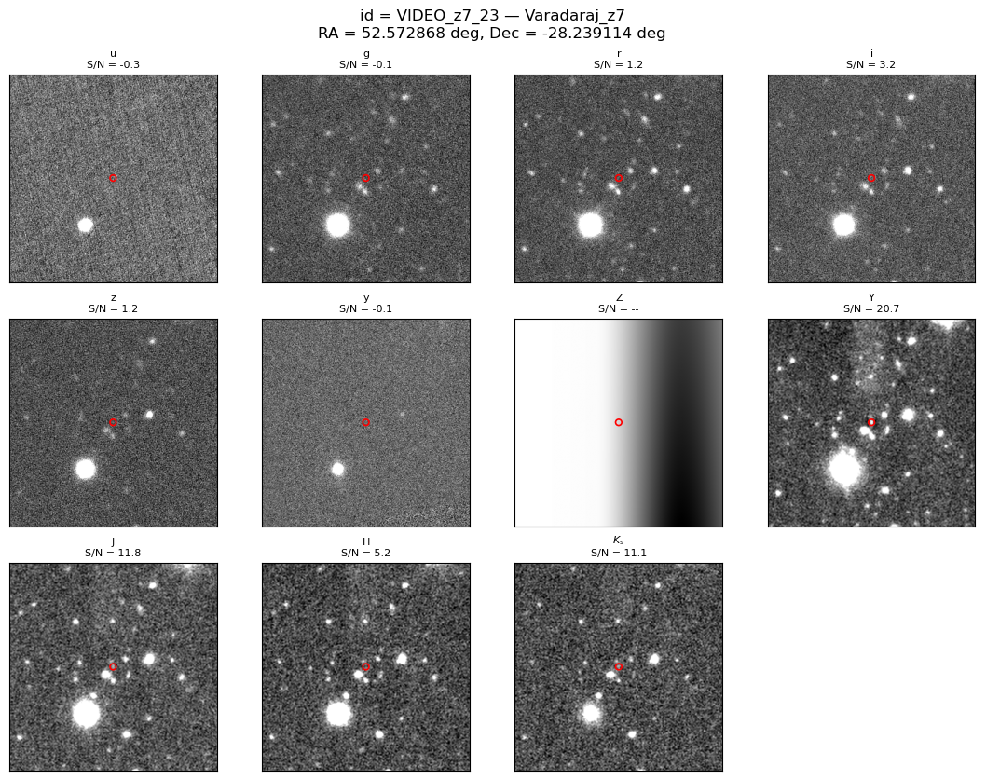

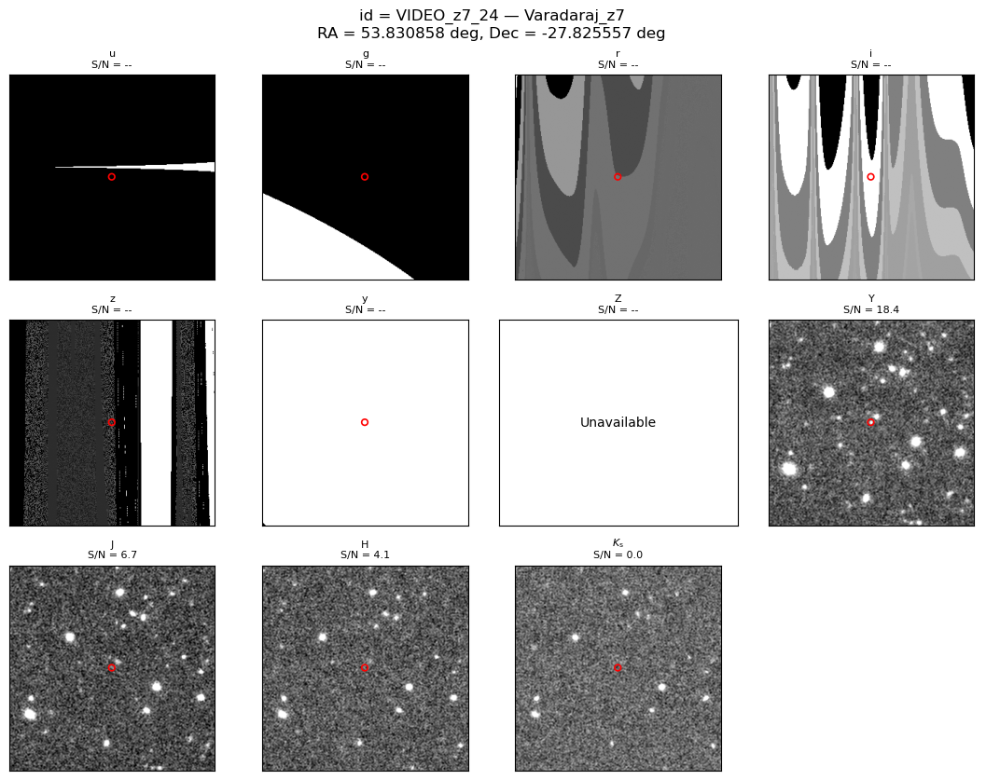

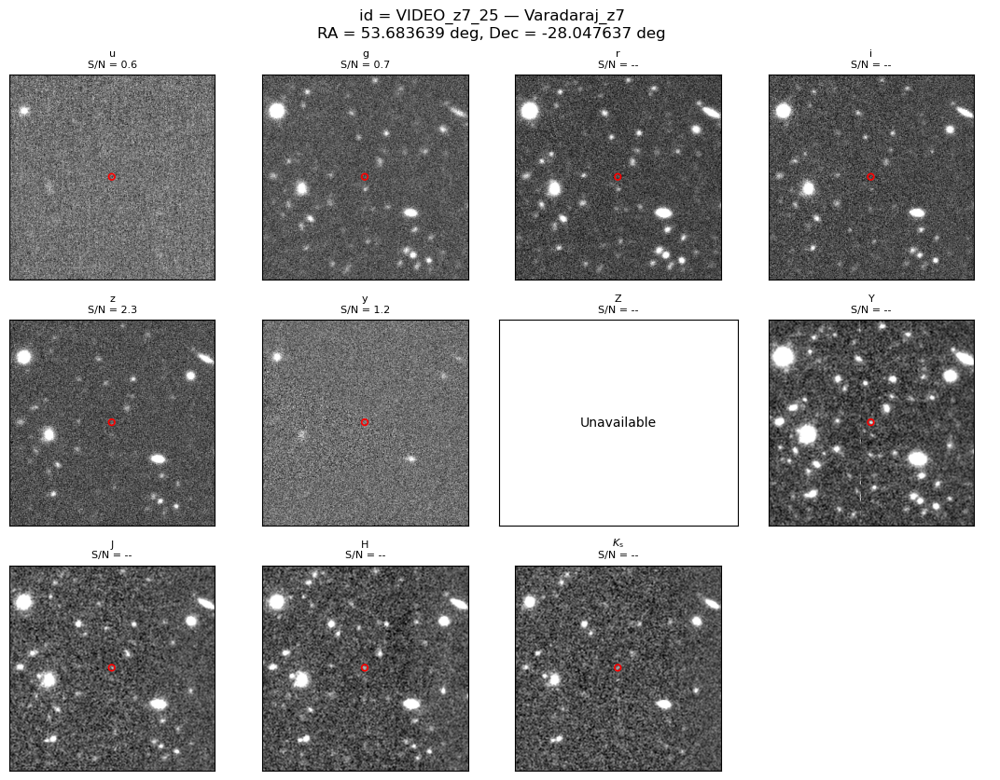

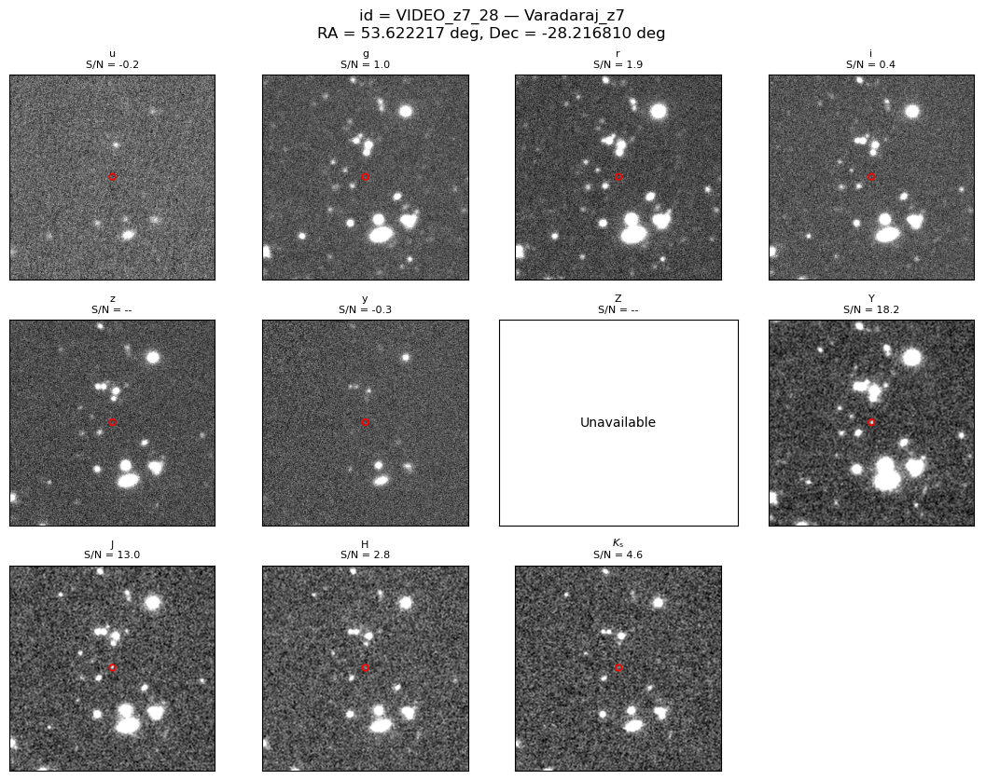

In [16]:
# ============================================================
# Varadaraj et al. (2023) matched z~7 candidates
# ============================================================

VARADARAJ_FILE = Path(
    "data/DP1_varadaraj_matched_forced.csv"
)


varadaraj_dp1 = pd.read_csv(
    VARADARAJ_FILE
)


print(
    "Matched Varadaraj candidates:",
    len(varadaraj_dp1),
)


display(
    varadaraj_dp1[
        [
            "id",
            "z_phot",
            "catalog_row",
            "match_sep_arcsec",
            "n_ComCam_5sig",
            "n_VIRCAM_5sig",
            "valid_griz",
            "valid_YJHKs",
            "NIR_extreme",
        ]
    ]
)


# ------------------------------------------------------------
# Show eleven-band cutouts for all matched candidates
# ------------------------------------------------------------

for candidate_index in range(
    len(varadaraj_dp1)
):

    plot_candidate(
        varadaraj_dp1,
        candidate_index,
        id_column="id",
    )

    plt.close("all")
    gc.collect()

In [17]:
# ============================================================
# Information of candidates
# ============================================================

table = (
    varadaraj_dp1[
        [
            "id",
            "published_ra_deg",
            "published_dec_deg",
            "z_phot",
            "match_sep_arcsec",
        ]
    ]
    .copy()
)


table = table.rename(
    columns={
        "published_ra_deg":
            "RA_deg",
        "published_dec_deg":
            "Dec_deg",
    }
)


TABLE_FILE = Path(
    "data/Varadaraj_z7_candidates.csv"
)

table.to_csv(
    TABLE_FILE,
    index=False,
)


display(
    table
)

print("\nSaved:")
print(TABLE_FILE)

,id,RA_deg,Dec_deg,z_phot,match_sep_arcsec
0,VIDEO_z7_23,52.572917,-28.239086,6.52,0.185354
1,VIDEO_z7_24,53.830875,-27.825597,6.57,0.154993
2,VIDEO_z7_25,53.683667,-28.047700,6.59,0.242628
3,VIDEO_z7_28,53.622208,-28.216797,7.38,0.053069



Saved:
data/Varadaraj_z7_candidates.csv


### 10. Varadaraj high-redshift paper figure


Paper source: VIDEO_z7_23
RA, Dec: 52.57286808837293 -28.23911418123376
  u: (300, 300)
  g: (300, 300)
  r: (300, 300)
  i: (300, 300)
  z: (300, 300)
  y: (300, 300)
  Y: (300, 300)
  J: (300, 300)
  H: (300, 300)
  K: (300, 300)
Saved: data/image_products/dp1_varadaraj_highz_example.pdf


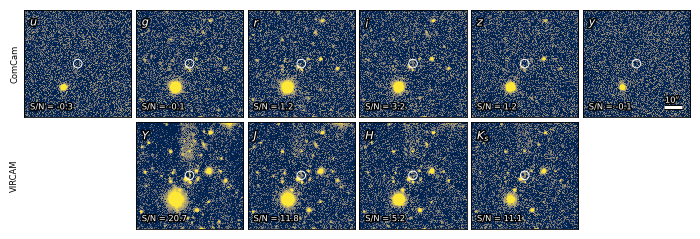

In [18]:
# ============================================================
# VARADARAJ HIGH-REDSHIFT PAPER FIGURE
#
# One candidate:
#     VIDEO_z7_23
#
# Row 1: ComCam ugrizy
# Row 2: VIRCAM YJHKs
#
# The VIRCAM Z band is excluded because no usable image
# is available at the position of this source.
#
# Display treatment, panel dimensions, annotations and scale
# bar follow the final extreme-source paper figure.
# ============================================================


# ------------------------------------------------------------
# Bands shown in this figure
# ------------------------------------------------------------

PAPER_VIRCAM_BANDS = [
    "Y",
    "J",
    "H",
    "K",
]


PAPER_BANDS = (
    COMCAM_BANDS
    + PAPER_VIRCAM_BANDS
)


# ------------------------------------------------------------
# Select the Varadaraj source
# ------------------------------------------------------------

PAPER_VARADARAJ_ID = (
    "VIDEO_z7_23"
)


paper_matches = (
    varadaraj_dp1[
        varadaraj_dp1["id"]
        == PAPER_VARADARAJ_ID
    ]
)


if len(paper_matches) != 1:

    raise ValueError(
        f"Expected exactly one source with "
        f"id={PAPER_VARADARAJ_ID}, "
        f"but found {len(paper_matches)}."
    )


paper_source = (
    paper_matches.iloc[0]
)


print(
    "\nPaper source:",
    paper_source["id"],
)

print(
    "RA, Dec:",
    paper_source["ra_deg"],
    paper_source["dec_deg"],
)


# ============================================================
# Load ten image cutouts
# ============================================================

arrays = {}


for band in PAPER_BANDS:

    try:

        array = load_band(
            float(
                paper_source["ra_deg"]
            ),
            float(
                paper_source["dec_deg"]
            ),
            band,
        )


        # ----------------------------------------------------
        # Check that the cutout contains usable pixels
        # ----------------------------------------------------

        finite_values = (
            np.ma.array(
                array,
                copy=False,
            )
            .compressed()
        )


        finite_values = (
            finite_values[
                np.isfinite(
                    finite_values
                )
            ]
        )


        if finite_values.size == 0:

            arrays[band] = None

            print(
                f"  {band}: no finite pixels"
            )

            continue


        arrays[band] = array


        print(
            f"  {band}:",
            array.shape,
        )


    except Exception as exc:

        arrays[band] = None

        print(
            f"  {band}: FAILED",
            exc,
        )


# ============================================================
# Figure geometry
#
# Final extreme-source figure:
#     7.4 x 5.55 inch
#     four rows
#
# This figure:
#     7.4 x 2.775 inch
#     two rows
#
# This keeps the same physical panel size, horizontal spacing
# and vertical separation as the extreme-source figure.
# ============================================================

fig_w = 7.4
fig_h = 2.775


fig = plt.figure(
    figsize=(
        fig_w,
        fig_h,
    )
)


# ------------------------------------------------------------
# Horizontal geometry
# ------------------------------------------------------------

label_left = 0.072

panel_left = 0.085
panel_right = 0.985

panel_gap_x = 0.006


panel_w = (
    panel_right
    - panel_left
    - 5 * panel_gap_x
) / 6.0


panel_h = (
    panel_w
    * fig_w
    / fig_h
)


# ------------------------------------------------------------
# Vertical geometry
# ------------------------------------------------------------

vertical_scale = (
    5.55
    / fig_h
)


row_gap = (
    0.008
    * vertical_scale
)


bottom_vista = (
    0.055
    * vertical_scale
)


bottom_comcam = (
    bottom_vista
    + panel_h
    + row_gap
)


# ============================================================
# Create axes
# ============================================================

axes = {}


# ------------------------------------------------------------
# Row 1: six ComCam panels
# ------------------------------------------------------------

for i, band in enumerate(
    COMCAM_BANDS
):

    x0 = (
        panel_left
        + i
        * (
            panel_w
            + panel_gap_x
        )
    )


    axes[band] = fig.add_axes(
        [
            x0,
            bottom_comcam,
            panel_w,
            panel_h,
        ]
    )


# ------------------------------------------------------------
# Row 2: four centred VIRCAM panels
# ------------------------------------------------------------

comcam_total_width = (
    6 * panel_w
    + 5 * panel_gap_x
)


vista_total_width = (
    4 * panel_w
    + 3 * panel_gap_x
)


vista_left = (
    panel_left
    + 0.5
    * (
        comcam_total_width
        - vista_total_width
    )
)


for i, band in enumerate(
    PAPER_VIRCAM_BANDS
):

    x0 = (
        vista_left
        + i
        * (
            panel_w
            + panel_gap_x
        )
    )


    axes[band] = fig.add_axes(
        [
            x0,
            bottom_vista,
            panel_w,
            panel_h,
        ]
    )


# ============================================================
# Draw panels
# ============================================================

for band in PAPER_BANDS:

    ax = axes[band]

    array = arrays[band]


    ax.set_xticks([])
    ax.set_yticks([])


    for spine in (
        ax.spines.values()
    ):

        spine.set_linewidth(
            0.6
        )

        spine.set_color(
            "black"
        )


    # --------------------------------------------------------
    # Formal forced-photometry S/N
    # --------------------------------------------------------

    if band in COMCAM_BANDS:

        snr_column = (
            f"raw_snr_ComCam_{band}"
        )

    else:

        snr_column = (
            f"raw_snr_VIRCAM_{band}"
        )


    try:

        snr = float(
            paper_source[
                snr_column
            ]
        )

    except Exception:

        snr = np.nan


    if np.isfinite(snr):

        if abs(snr) < 0.05:

            snr = 0.0


        snr_text = (
            f"S/N = {snr:.1f}"
        )

    else:

        snr_text = (
            "S/N = --"
        )


    # --------------------------------------------------------
    # Missing image
    # --------------------------------------------------------

    if array is None:

        ax.set_facecolor(
            "0.90"
        )


        ax.text(
            0.055,
            0.93,
            PANEL_LABELS[band],
            transform=ax.transAxes,
            ha="left",
            va="top",
            color="black",
            fontsize=9.5,
        )


        ax.text(
            0.055,
            0.055,
            "S/N = --",
            transform=ax.transAxes,
            ha="left",
            va="bottom",
            color="black",
            fontsize=7.0,
        )


        continue


    # --------------------------------------------------------
    # Same normalization as the extreme-source figure
    # --------------------------------------------------------

    norm = display_normalization(
        array,
        band,
    )


    ax.set_facecolor(
        plt.get_cmap(
            CMAP_NAME
        )(0.0)
    )


    ax.imshow(
        array,
        origin="lower",
        cmap=CMAP_NAME,
        norm=norm,
        interpolation="none",
    )


    height, width = (
        array.shape
    )


    ax.set_xlim(
        -0.5,
        width - 0.5,
    )


    ax.set_ylim(
        -0.5,
        height - 0.5,
    )


    ax.set_aspect(
        "equal",
        adjustable="box",
    )


    # --------------------------------------------------------
    # Band label
    # --------------------------------------------------------

    ax.text(
        0.055,
        0.93,
        PANEL_LABELS[band],
        transform=ax.transAxes,
        ha="left",
        va="top",
        color="white",
        fontsize=8,
        path_effects=[
            pe.withStroke(
                linewidth=2.1,
                foreground="black",
            )
        ],
    )


    # --------------------------------------------------------
    # S/N annotation
    # --------------------------------------------------------

    ax.text(
        0.055,
        0.055,
        snr_text,
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        color="white",
        fontsize=6.0,
        path_effects=[
            pe.withStroke(
                linewidth=1.9,
                foreground="black",
            )
        ],
    )


    # --------------------------------------------------------
    # Target circle
    # --------------------------------------------------------

    centre = (
        0.5
        * (
            CUTOUT_SIZE_PIX
            - 1
        )
    )


    circle = plt.Circle(
        (
            centre,
            centre,
        ),
        CIRCLE_RADIUS_PIX,
        facecolor="none",
        edgecolor="white",
        linewidth=CIRCLE_LINEWIDTH,
    )


    ax.add_patch(
        circle
    )


# ============================================================
# Instrument labels
# ============================================================

fig.text(
    label_left,
    bottom_comcam
    + 0.5
    * panel_h,
    "ComCam",
    rotation=90,
    ha="center",
    va="center",
    fontsize=6,
)


fig.text(
    label_left,
    bottom_vista
    + 0.5
    * panel_h,
    "VIRCAM",
    rotation=90,
    ha="center",
    va="center",
    fontsize=6,
)


# ============================================================
# 10-arcsec scale bar
#
# Same position and style as the extreme-source figure:
# rightmost ComCam y panel.
# ============================================================

def add_scale_bar(ax):

    bar_length_pix = (
        SCALE_BAR_ARCSEC
        / PIXEL_SCALE_ARCSEC
    )


    bar_x1 = (
        0.92
        * CUTOUT_SIZE_PIX
    )


    bar_x0 = (
        bar_x1
        - bar_length_pix
    )


    bar_y = (
        0.09
        * CUTOUT_SIZE_PIX
    )


    ax.plot(
        [
            bar_x0,
            bar_x1,
        ],
        [
            bar_y,
            bar_y,
        ],
        color="white",
        linewidth=2.2,
        solid_capstyle="butt",
        path_effects=[
            pe.withStroke(
                linewidth=3.8,
                foreground="black",
            )
        ],
    )


    ax.text(
        0.5
        * (
            bar_x0
            + bar_x1
        ),
        bar_y
        + 0.025
        * CUTOUT_SIZE_PIX,
        (
            rf"{SCALE_BAR_ARCSEC:g}"
            r"$^{\prime\prime}$"
        ),
        ha="center",
        va="bottom",
        color="white",
        fontsize=6.0,
        path_effects=[
            pe.withStroke(
                linewidth=2.0,
                foreground="black",
            )
        ],
    )


add_scale_bar(
    axes["y"]
)


# ============================================================
# Save paper figure
# ============================================================

VARADARAJ_PAPER_PDF = Path(
    "data/image_products/"
    "dp1_varadaraj_highz_example.pdf"
)


VARADARAJ_PAPER_PDF.parent.mkdir(
    parents=True,
    exist_ok=True,
)


fig.savefig(
    VARADARAJ_PAPER_PDF,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.025,
)


print(
    "Saved:",
    VARADARAJ_PAPER_PDF,
)


plt.show()